# Helping Diagnose Cervical Cancer with Neural Networks
## By Brendan Bailey

## Warning: This Jupyter Notebook does contain medical images

For my General Assembly Capstone Project, I decided to enter [Kaggle's Cervical Cancer Competition](https://www.kaggle.com/c/intel-mobileodt-cervical-cancer-screening). This notebook is an exploration of what I have learned using convolutional neural networks and pca/svms to analyze cervical image data.

We were given over a 1,000 cervix photos, and had to train a model on how to properly identify cervix type based on those photos. What type of cervix is based on where the transformation zone, an area likely to develop cancer, is located. This is important because in places where they do not have the resources to do a pap smear, they do a visual inspection applying ascetic acid to the transformation zone to identify cancerous lesions. If the cervix is type 3 and part of the transformation zone is not visible, then the healthcare provider will need to account for that during this procedure. What makes this problem difficult is it is hard to distinguish cervix types with the untrained eye, which is why Kaggle is hosting this competition.

In [1]:
from IPython.display import Image

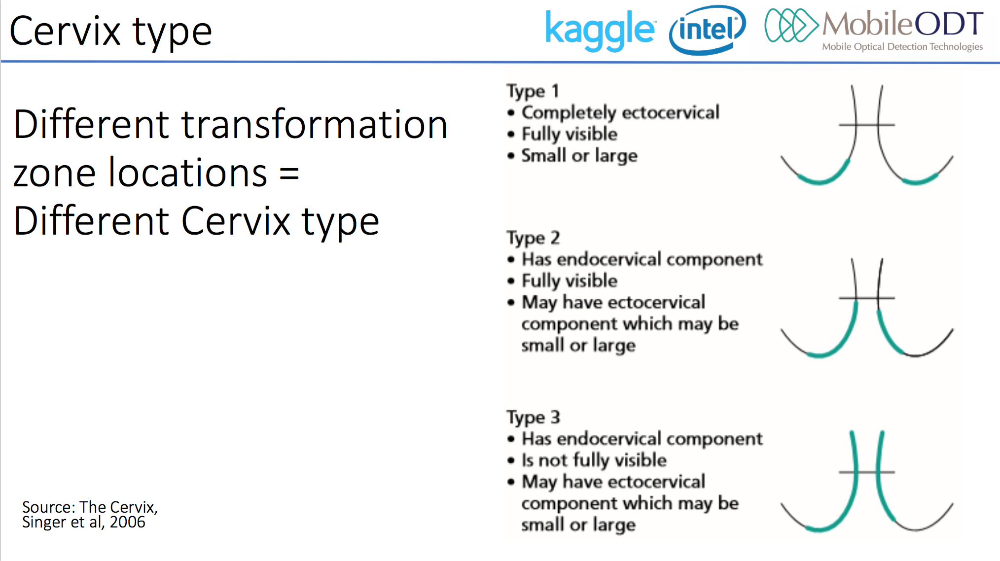

In [2]:
Image("type_image.png")

## Exploratory Data Analysis

Below is an exploration of the photos given within the training set.

In [3]:
#Importing Relevant Libraries
import os
import pandas as pd
import matplotlib.pyplot as plt
from skimage.io import imread
from shutil import copyfile
import tensorflow
import cv2
import numpy as np
import seaborn as sns

from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss
from sklearn.model_selection import GridSearchCV

from keras.utils.np_utils import to_categorical 
from keras.models import Sequential
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.layers.convolutional import Convolution2D, MaxPooling2D, Cropping2D
from keras.layers import Conv2D, MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import RMSprop
from keras.models import load_model
from keras import losses

%matplotlib inline
plt.style.use('ggplot')

Couldn't import dot_parser, loading of dot files will not be possible.


Using TensorFlow backend.


Reading in image data. We can see that most photos are 3000 x 3000 and are RGB.

In [4]:
img_list = []
def populate_img_list(indir, photo_list): #http://stackoverflow.com/questions/11801309/how-to-loop-over-files-with-python/11801336
    image_count = 0
    error_count = 0
    for root, dirs, filenames in os.walk(indir):
        for f in filenames:
            if f != ".DS_Store":
                try:
                    img = imread(os.path.join(root, f))
                    photo_list.append([f, indir, img.shape[0], img.shape[1], img.shape[2]])
                    image_count += 1
                except ValueError:
                    error_count += 1
    print "indir: %s images: %s errors: %s" % (indir, image_count, error_count)
populate_img_list("data/kaggle/train/Type_1", img_list)
populate_img_list("data/kaggle/train/Type_2", img_list)
populate_img_list("data/kaggle/train/Type_3", img_list)
df = pd.DataFrame(img_list, columns = ["img_name", "path", "height", "width", "chan"])
df["label"] = df.path.str[-6:]
df.head()

indir: data/kaggle/train/Type_1 images: 249 errors: 1
indir: data/kaggle/train/Type_2 images: 781 errors: 0
indir: data/kaggle/train/Type_3 images: 450 errors: 0


,img_name,path,height,width,chan,label
0,0.jpg,data/kaggle/train/Type_1,3264,2448,3,Type_1
1,10.jpg,data/kaggle/train/Type_1,4128,3096,3,Type_1
2,1013.jpg,data/kaggle/train/Type_1,3264,2448,3,Type_1
3,1014.jpg,data/kaggle/train/Type_1,4128,3096,3,Type_1
4,1019.jpg,data/kaggle/train/Type_1,3264,2448,3,Type_1


In [12]:
df.describe()

,height,width,chan
count,1480.000000,1480.000000,1480.0
mean,3661.394595,2783.444595,3.0
std,501.981815,384.141845,0.0
min,640.000000,480.000000,3.0
25%,3264.000000,2448.000000,3.0
50%,3264.000000,3096.000000,3.0
75%,4128.000000,3096.000000,3.0
max,4160.000000,4128.000000,3.0


We can see that there are unbalanced classes with Type 2 being the most common. The distribution is 16% are type 1, 52% are type 2, and 30% are type 3. The way the kaggle competition works is that you are given a test images, and for each image you need to give the probability of it being type 1, type 2, and type 3. If you submit the distribution below for every image within the test set, then you will get the baseline Kaggle score which is a logloss of 1.00575. The way logloss works is it penalizes being wrong more than being uncertain, and the goal is to get the smallest score possible.

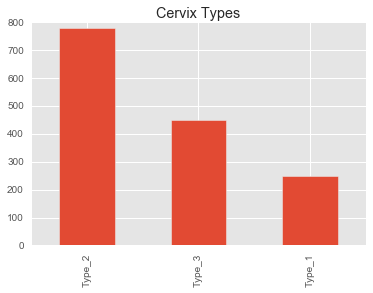

In [13]:
df.label.value_counts().plot(kind = "bar", title = "Cervix Types")

In [14]:
df.label.value_counts()/len(df)

Type_2    0.527703
Type_3    0.304054
Type_1    0.168243
Name: label, dtype: float64

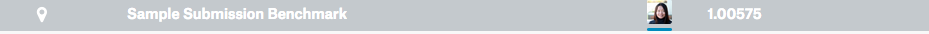

In [15]:
Image("KaggleBaseline.png")

Below is a sample image of the a cervix with the transformation zone, and examples of Type 1, Type 2, and Type 3 Cervixes. This is where the first lesson I learned came from - if you're a novice at this you should choose a problem that you as a human can solve.

For example, [Kaggle’s Dog vs Cat Competition](https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition) or [Silicon Valley’s Hotdog App](https://www.youtube.com/watch?v=ACmydtFDTGs). With these simpler problems, you can probably more easily apply preprocessing techniques that could aid your algorithm ([such as canny edge detection](https://medium.com/towards-data-science/m2m-day-185-my-attempt-to-intuitively-explain-how-this-self-driving-car-algorithm-works-7422eb2b135e)).

This is compared to the cervical image challenge, where the photos are very similar with slightly different nuances that distinguish class. And therein lies the heart of the problem —  if these cervix types were easy for humans to differentiate, then we wouldn’t need the aid of computer vision. Because of this given obstacle, I think this challenge is better posed to computer vision experts or physicians with machine learning experience than folks starting out like me.

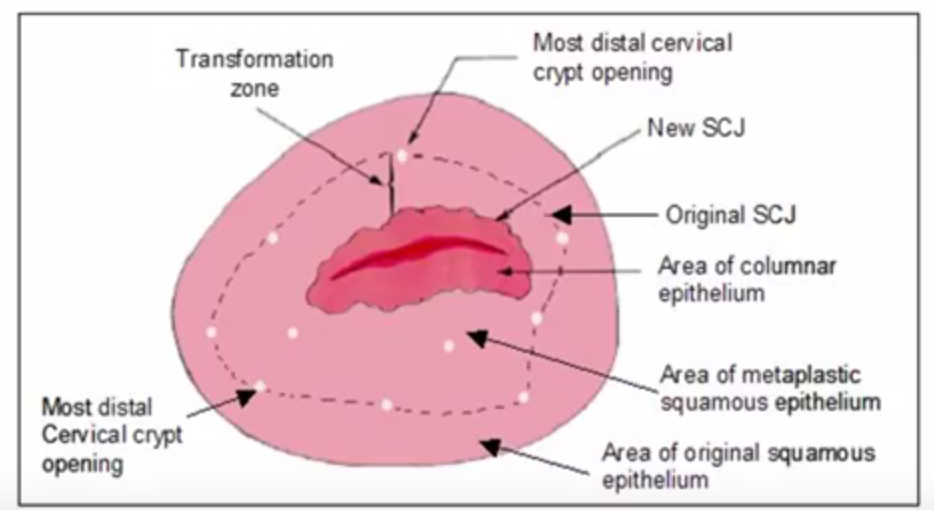

In [19]:
Image("cervix_example.png", width = 400, height = 400)

Type 1


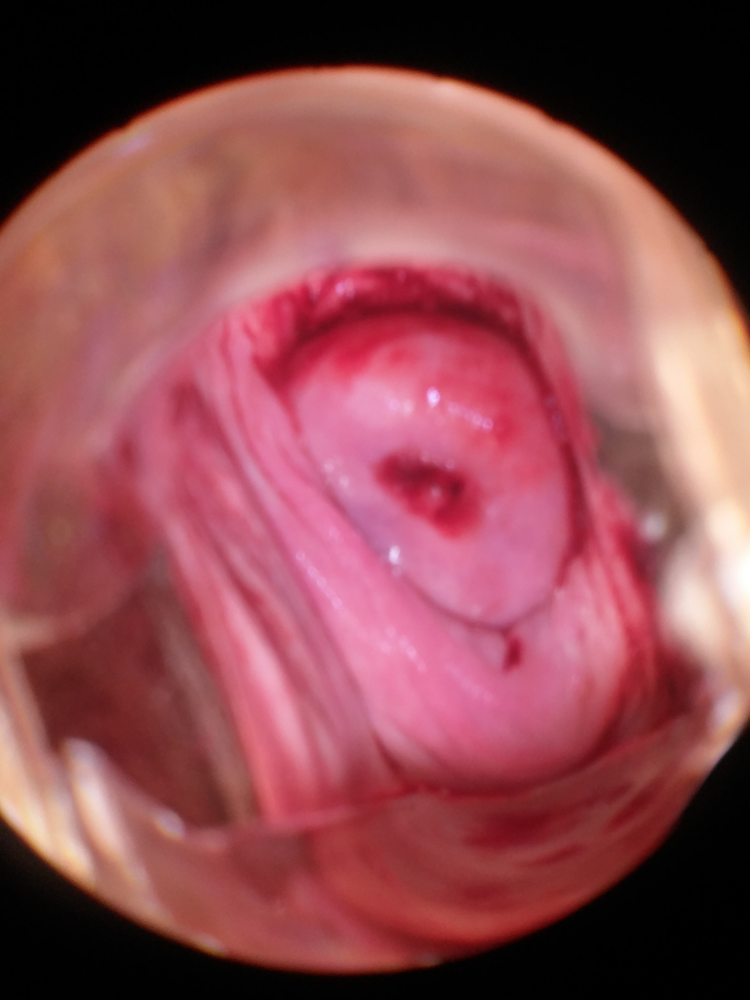

In [20]:
type_1_image = df[df.label == "Type_1"].iloc[0].path + "/" + df[df.label == "Type_1"].iloc[0].img_name
print "Type 1"
Image(type_1_image, width = 200, height = 200)

Type 2


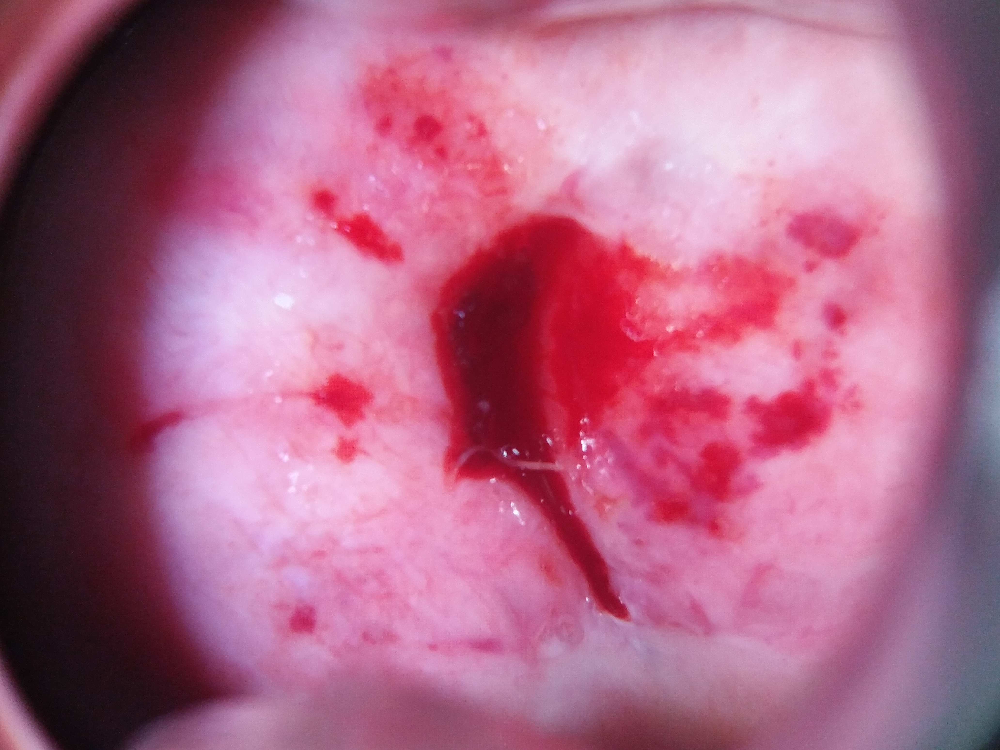

In [21]:
type_2_image = df[df.label == "Type_2"].iloc[5].path + "/" + df[df.label == "Type_2"].iloc[5].img_name
print "Type 2"
Image(type_2_image, width = 200, height = 200)

Type 3


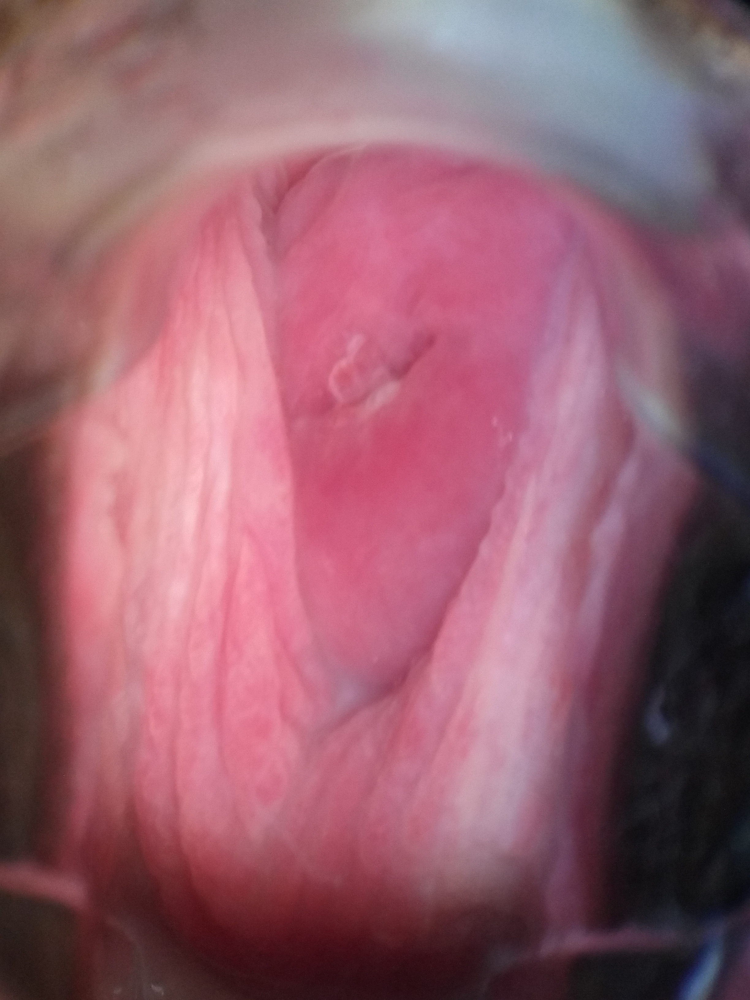

In [22]:
type_3_image = df[df.label == "Type_3"].iloc[0].path + "/" + df[df.label == "Type_3"].iloc[0].img_name
print "Type 3"
Image(type_3_image, width = 200, height = 200)

Applying a train test split to the data. The way Keras is built, it's easier if you have a train and test folder so that you can use the flow from directory method. Here I'm going to create new folders and copy the images into the folders within my home directory based on whether they are train or test.

In [23]:
X_train, X_test, y_train, y_test = train_test_split(df[["path", "img_name", "label"]], df["label"], test_size=0.3, stratify = df["label"], random_state = 754142)

In [24]:
X_train.shape, X_test.shape

((1036, 3), (444, 3))

In [25]:
def copy_files(dataframe, destination_folder):
    if not os.path.exists(destination_folder): #Assumption is if path exists, then images are in that folder
        os.makedirs(destination_folder)
        os.makedirs(destination_folder + "/Type_1")
        os.makedirs(destination_folder + "/Type_2")
        os.makedirs(destination_folder + "/Type_3")
        for index, image in dataframe.iterrows():
            source_path = image["path"] + "/" + image["img_name"]
            dst_path = destination_folder + "/" + image["label"] + "/" + image["img_name"]
            copyfile(source_path, dst_path)

In [26]:
copy_files(X_train, "train_split")
copy_files(X_test, "val_split")

## Model Building

The initial architecture I used was Stanford Professor Andrej Karpathy’s recommended framework for picking up more complex features (Input -> [Conv -> Relu -> Conv -> Relu -> Pool]*3 -> [FC -> Relu] * 2 -> FC).

~~~~
model = Sequential()
#Conv Set 1
model.add(Conv2D(32, (3, 3), input_shape=(3, 150, 150), data_format = "channels_first"))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

#Conv Set 2
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

#Conv Set 3
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
#model.add(MaxPooling2D(pool_size=(2, 2))) (Keras would not let me pool once more due to dimensions)

#FC Set 1 
model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))

#FC Set 2
model.add(Dense(128))
model.add(Activation('relu'))

#Final FC
model.add(Dense(3))
model.add(Activation('softmax'))

model.compile(loss=tensorflow.losses.log_loss,
              optimizer='rmsprop',
              metrics=['categorical_accuracy'])

batch_size = 16

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True, data_format = "channels_first")

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1./255, data_format = "channels_first")

# this is a generator that will read pictures found in
# subfolers of 'data/train', and indefinitely generate
# batches of augmented image data
train_generator = train_datagen.flow_from_directory(
        'train_split',  # this is the target directory
        target_size=(150, 150),  # all images will be resized to 150x150
        batch_size=batch_size)

validation_generator = test_datagen.flow_from_directory(
        'val_split',
        target_size=(150, 150),
        batch_size=batch_size)

history = model.fit_generator(
        train_generator,
        validation_data = validation_generator,
        steps_per_epoch=(2000 // batch_size),
        epochs=2,
        validation_steps=(800 // batch_size))

model.save("my_first_neural_network_20170513.h5")

final_test_datagen = ImageDataGenerator(rescale=1./255, data_format = "channels_first")

final_test_generator = final_test_datagen.flow_from_directory(
        'data/kaggle/test1',
        target_size=(150, 150),
        batch_size=batch_size,
        class_mode = None)

predictions = model.predict_generator(
        final_test_generator,
        steps = (2000 // batch_size))

submission_list = []
for f, prediction in zip(final_test_generator.filenames, predictions):
    submission_list.append([f.strip("test/"), prediction[0], prediction[1], prediction[2]])
submission_frame = pd.DataFrame(submission_list, columns = ["image_name","Type_1","Type_2","Type_3"])
submission_frame.to_csv("submissions/my_first_neural_network_20170513.csv", index = False)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig("submissions/my_first_neural_network_20170513.png")
plt.show()
~~~~

The above was how I set up my first neural network. After two epochs it got a Kaggle score 1.00616, and it essentially categorized all records as having the probabilities of 17.8% being type 1, 51.5% being type 2, and 30.5% being type 3.

In [29]:
pd.read_csv("submissions/my_first_neural_network_20170513.csv").describe()

,Type_1,Type_2,Type_3
count,512.000000,512.000000,512.000000
mean,0.178666,0.515354,0.305980
std,0.003777,0.005228,0.001526
min,0.168101,0.494967,0.302292
25%,0.175902,0.511714,0.304867
50%,0.178500,0.515597,0.305916
75%,0.181316,0.519155,0.306986
max,0.193466,0.529606,0.311567


Notice that `model.compile(loss=tensorflow.losses.log_loss, optimizer='rmsprop', metrics=['categorical_accuracy'])` has `tensorflow.losses.log_loss` as its loss function. This is where I learned my second lesson of using native loss functions.

I used Keras to build my network, and when I started I noticed they did not have logloss as a [loss function](https://keras.io/losses/). The docs do say that Tensorflow loss functions are compatible, so I used [Tensorflow’s logloss function](https://www.tensorflow.org/api_docs/python/tf/losses/log_loss). With my initial models my validation loss was consistently lower than my Kaggle loss. This was bad because instead of reflecting how my model would perform in the real world, my validation loss gave a much rosier picture.

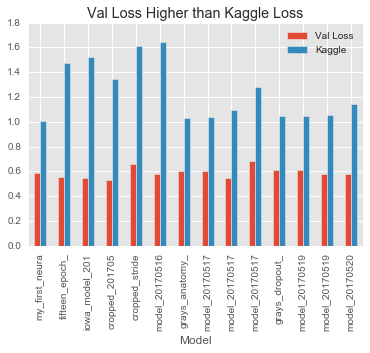

In [30]:
submission_tracker = pd.read_excel("submission_tracker.xlsx")
loss_df = submission_tracker.dropna(subset=["Kaggle", "Val Loss"])
loss_df = loss_df[loss_df.Date <= "2017-05-19"]
loss_df = loss_df[loss_df.Kaggle < 16] #Removing outlier from graph so it's easier to visualize
loss_df.plot(kind = "bar", x = loss_df.Model.str[0:14], y = ["Val Loss","Kaggle"], title = "Val Loss Higher than Kaggle Loss")

At some point I decided I needed to look at other kernels to see what was going on, and I saw that other Kaggle users were using Keras’s native categorical cross entropy as their loss function. 

Apparently, logloss and cross entropy are the same concept. So I switched my loss to categorical cross entropy, and my validation loss more closely reflects the loss I get on Kaggle.

I also kept running into the problem where my networks were overfit. The more epochs I added the more my train loss and test loss diverged showing my architecture does not generalize well. Even if I only trained for a few epochs, I would still not achieve a result that beat baseline. I tried changing my model in various ways: adding dropout, decreasing my convolutional stride, cropping and grayscaling my images. No matter how I changed my architecture or how many epochs I ran (whether high or low), I could not beat baseline.

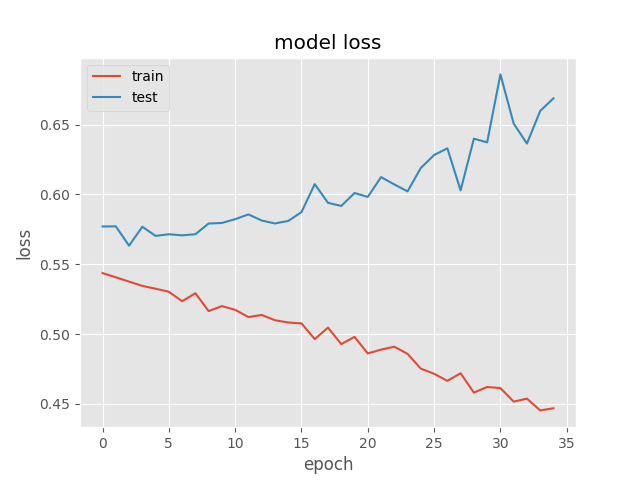

In [36]:
Image("submissions/model_20170517230603.png")

I really needed help, so I decided to look at what people were doing on Kaggle and saw [Owl1’s kernel](https://www.kaggle.com/the1owl/artificial-intelligence-for-cc-screening/notebook/notebook). The initial architecture I used was Professor Karpathy’s recommended framework for picking up more complex features `(Input -> [Conv -> Relu -> Conv -> Relu -> Pool]*3 -> [FC -> Relu] * 2 -> FC)`. Owl1’s kernel is much simpler, similar to another framework Karpathy suggests `(Input -> [Conv -> Relu -> Pool]*2 -> FC -> Relu -> FC])`. Owl1 also boasts a 0.89 logloss, way better than any score I received.

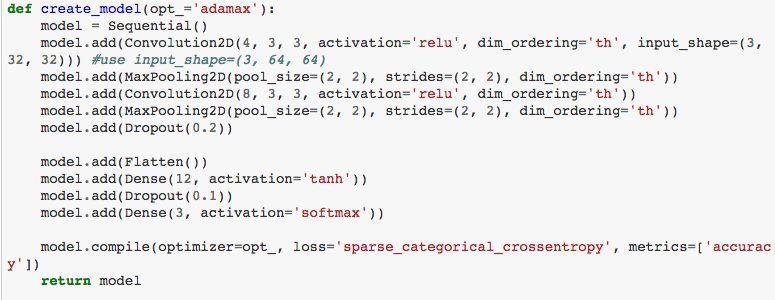

In [34]:
Image("owl1.png")

I didn’t want to outright copy Owl1, but I did want to learn from his model. I iteratively changed my model so that it was closer to his. Below is my first iteration making a smaller architecture.

```
model = Sequential()
#Adding cropping
model.add(Cropping2D(cropping=25, data_format="channels_first", input_shape=(1,150,150)))

#Conv Set 1
model.add(Conv2D(32, (3, 3), data_format = "channels_first"))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), data_format="channels_first"))
model.add(Dropout(0.25))

#Conv Set 2
model.add(Conv2D(32, (3, 3), data_format="channels_first"))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), data_format="channels_first"))
model.add(Dropout(0.25))

#FC Set 1
model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))

#Final FC
model.add(Dense(3))
model.add(Activation('softmax'))

model.compile(loss=losses.categorical_crossentropy,
              optimizer=RMSprop(lr=0.0001),
              metrics=['categorical_accuracy'])
              ```

This was the first iteration of many. After the first 15 epochs, it seemed to show promise so I set it to train over night with an extra 85 epochs using the capstone_continue_training.py script in the repo. Unfortunately, the extra epochs still led to the same problem scoring on Kaggle 2.33676.

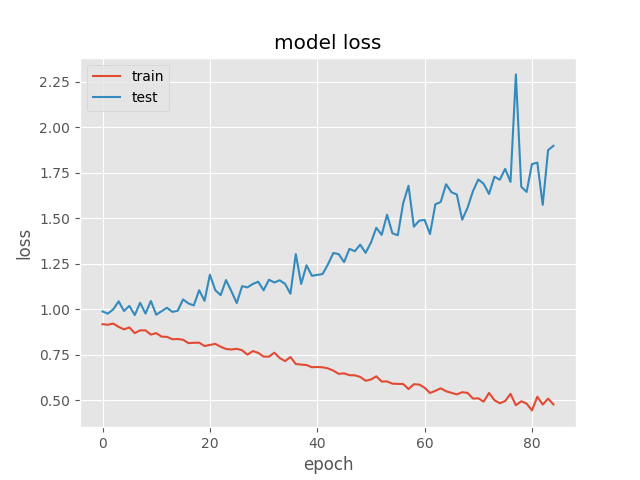

In [35]:
Image("submissions/model_20170521195602.png")

So I kept trying to make modifications:
* Using less filters on my convolutional layers - unscored due to too many submissions that day

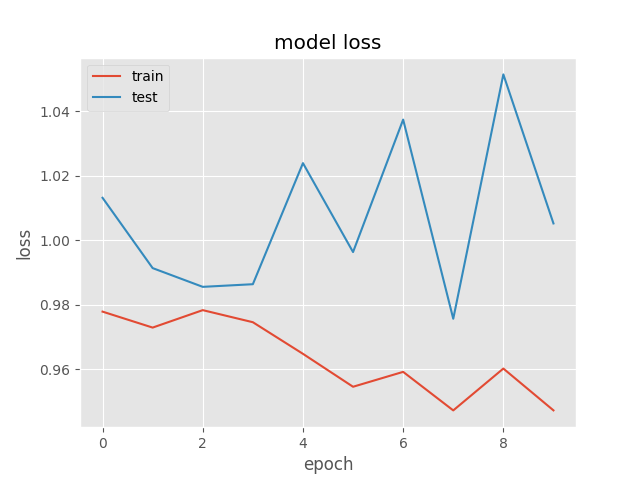

In [37]:
Image("submissions/model_20170522191140.png")

* Switching from RMSProp to Adamax Optimizer - 1.1356 Kaggle Score

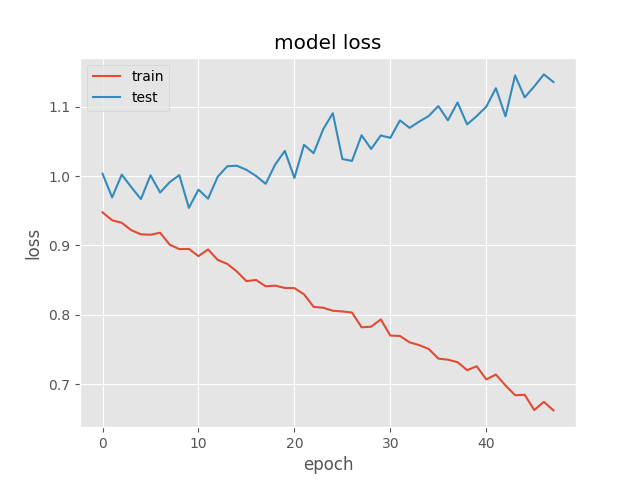

In [42]:
Image("submissions/model_20170523082521.png")

* Replaced the last relu activation with a tanh activation - 1.04240 Kaggle Score

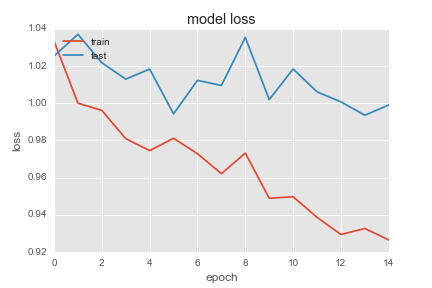

In [44]:
Image("submissions/tanh_20170522.png")

* Stopped converting my pictures to grayscale and used RGB - 1.62704 Kaggle Score

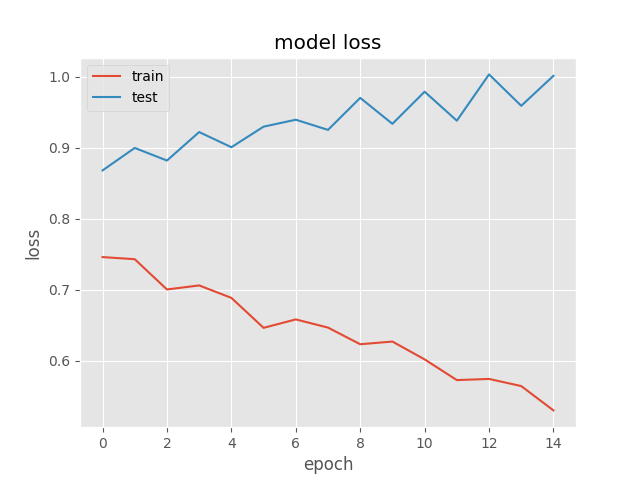

In [46]:
Image("submissions/model_20170523224129.png")

* Added a dropout after last activation - Kaggle Score 1.31165

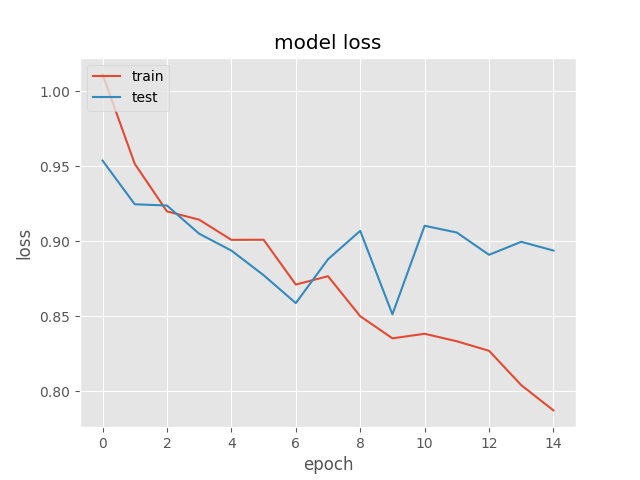

In [48]:
Image("submissions/fml_20170523.png")

* Eliminated image preprocessing steps used in the [Keras Blog](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html)

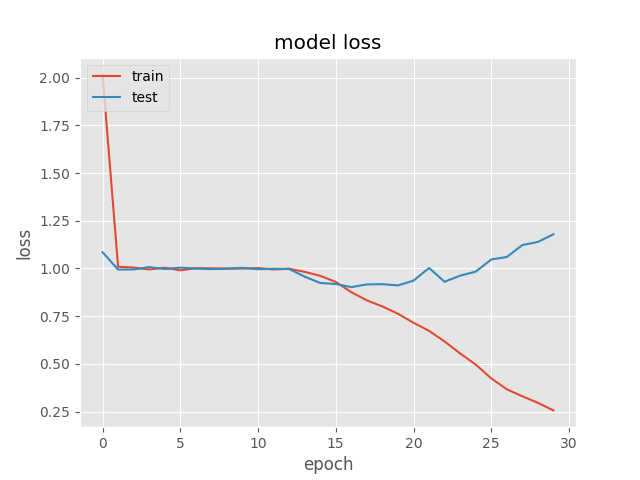

In [50]:
Image("submissions/whygodwhy_20170523.png")

```
model = Sequential()
#Adding cropping
model.add(Cropping2D(cropping=25, data_format="channels_first", input_shape=(3, 150, 150)))

#Conv Set 1
model.add(Conv2D(12, (3, 3), data_format = "channels_first"))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), data_format="channels_first"))
model.add(Dropout(0.25))

#Conv Set 2
model.add(Conv2D(25, (3, 3), data_format="channels_first"))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), data_format="channels_first"))
model.add(Dropout(0.25))

#FC Set 1
model.add(Flatten())
model.add(Dense(25))
model.add(Activation('tanh'))

#Final FC
model.add(Dense(3))
model.add(Activation('softmax'))

model.compile(loss=losses.categorical_crossentropy,
              optimizer='adamax',
              metrics=['categorical_accuracy'])
```

Unfortunately - none of the above iterations resulted in a model that beat the baseline, and my architecture was essentially becoming Owl1's.

At this point. I decided I just needed to copy Owl1's model to see if I could replicate it. Currently, I am in the process of training it. His Kernel says he trained it for 200 epochs. I will train it up until then or at least until I can beat Kaggle's baseline. Another option that I would like to consider is using one of Keras’s prebuilt models to see how it will perform.

This brings me to the last lesson I learned, which is neural networks are hard and take a lot of time.

At the end of this project I have spent:
* 11 Days Making Models
* Made 30 Neural Networks
* 16 Unique Architectures
* Trained Over 607 Epochs
* Spent Over $150 in Google Cloud Credit

This resulted in ZERO neural networks that beat Kaggle’s baseline. The closest one that did was the first neural network I made with a logloss of 1.00616 and only 2 epochs trained on it, and it essentially categorized all records as having the probabilities of 17.8% being type 1, 51.5% being type 2, and 30.5% being type 3.

Many people have shown that neural networks are a powerful tool, and I know I have a lot to learn. Ultimately, neural networks take a lot of time and energy, and may not always give the results you are looking for.

## PCA and Support Vector Machine Combo

I did get over the Kaggle’s baseline through an alternative method. I used a gray scaled/cropped version of the images and ran them through principal component analysis (PCA). PCA is a dimensionality reduction technique that uses linear algebra to combine features. Each 100 x 100 photo is represented by 10,000 variables, each variable indicating how bright or dark a pixel is. After running the photos through PCA, I selected 61 of 1,036 the resulting components (or combined features), which explained 90% of the variance in pixel brightness/darkness.

Below I am creating the grayscaled cropped images.

In [52]:
def crop_image(image_name, new_name):
    image = cv2.imread(image_name,0)
    
    # Gaussian Blur
    blurred_grey_image = cv2.GaussianBlur(image,(5,5),0)
    
    #Resized
    resized_image = cv2.resize(blurred_grey_image, dsize=(150,150))
    
    #Cropped
    crop_img = resized_image[25:125, 25:125]
    
    cv2.imwrite(new_name,crop_img)

def copy_files(dataframe, destination_folder):
    if not os.path.exists(destination_folder): #Assumption is if path exists, then images are in that folder
        os.makedirs(destination_folder)
        os.makedirs(destination_folder + "/Type_1")
        os.makedirs(destination_folder + "/Type_2")
        os.makedirs(destination_folder + "/Type_3")
        for index, image in dataframe.iterrows():
            source_path = image["path"] + "/" + image["img_name"]
            dst_path = destination_folder + "/" + image["label"] + "/" + image["img_name"]
            crop_image(source_path, dst_path)

def copy_test(initial_folder, destination_folder):
    if not os.path.exists(destination_folder): #Assumption is if path exists, then images are in that folder
        os.makedirs(destination_folder)
        for root, dirs, filenames in os.walk(initial_folder):
            for f in filenames:
                if f != ".DS_Store":
                    source_path = os.path.join(root, f)
                    dst_path = destination_folder + "/" + f
                    crop_image(source_path, dst_path)

copy_files(X_train, "train_split_crop")
copy_files(X_test, "val_split_crop")
copy_test("data/kaggle/test1/test", "test_crop")

Converting images into 10,000 variable vectors. 90% of variance in pixels is explained by 61 components within the 1,036 component PCA output.

indir: train_split_crop/Type_1 images: 174 errors: 0
indir: train_split_crop/Type_2 images: 547 errors: 0
indir: train_split_crop/Type_3 images: 315 errors: 0


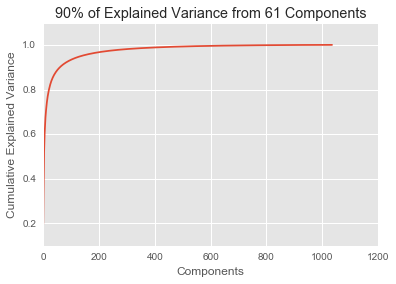

In [55]:
pca_train = []
def pca_img_list(indir, photo_list): #http://stackoverflow.com/questions/11801309/how-to-loop-over-files-with-python/11801336
    image_count = 0
    error_count = 0
    for root, dirs, filenames in os.walk(indir):
        for f in filenames:
            if f != ".DS_Store":
                try:
                    img = imread(os.path.join(root, f))
                    photo_list.append(list(img.flatten()))
                    image_count += 1
                except ValueError:
                    error_count += 1
    print "indir: %s images: %s errors: %s" % (indir, image_count, error_count)
pca_img_list("train_split_crop/Type_1", pca_train)
pca_img_list("train_split_crop/Type_2", pca_train)
pca_img_list("train_split_crop/Type_3", pca_train)
pca_train_target = ["Type_1"] * 174 + ["Type_2"] * 547 + ["Type_3"] * 315
pca_train_df = pd.DataFrame(pca_train)
pca_train_df = (pca_train_df - pca_train_df.mean()) / pca_train_df.std()
pca_model = PCA(n_components = 1036, random_state = 889534)
pca_model.fit(pca_train_df, pca_train_target)
plt.plot(pca_model.explained_variance_ratio_.cumsum())
plt.title("90% of Explained Variance from 61 Components")
plt.xlabel("Components")
plt.ylabel("Cumulative Explained Variance")

In [56]:
for i, cum in enumerate(pca_model.explained_variance_ratio_.cumsum()):
    if cum > 0.9:
        print i, cum
        break

60 0.90024497518


I then fed the results into scikitlearn’s support vector classifier using its default parameters (gridsearch results in a worse score). I barely hopped over Kaggle’s baseline submission with a logloss of 1.00574 after submitting my results.

In [57]:
pca_fit_df = pd.DataFrame(pca_model.transform(pca_train_df))
pca_fit_df = pd.DataFrame(pca_model.transform(pca_train_df))
pca_fit_df = pca_fit_df.ix[:,0:60]
svm = SVC(random_state = 262515, probability = True)
svm.fit(pca_fit_df, pca_train_target)
print "Train Log Loss (really bad): ", log_loss(pca_train_target, svm.predict_proba(pca_fit_df))

Train Log Loss (really bad):  5.26157353308


In [58]:
pca_val = []
pca_img_list("val_split_crop/Type_1", pca_val)
pca_img_list("val_split_crop/Type_2", pca_val)
pca_img_list("val_split_crop/Type_3", pca_val)
pca_val_df = pd.DataFrame(pca_val)
pca_val_target = ["Type_1"] * 75 + ["Type_2"] * 234 + ["Type_3"] * 135
pca_val_df = (pca_val_df - pca_train_df.mean()) / pca_train_df.std()
pca_valfit_df = pd.DataFrame(pca_model.transform(pca_val_df))
pca_valfit_df = pca_valfit_df.ix[:,0:60]
print "Validation Log Loss (performs mediocre):", log_loss(pca_val_target, svm.predict_proba(pca_valfit_df))

indir: val_split_crop/Type_1 images: 75 errors: 0
indir: val_split_crop/Type_2 images: 234 errors: 0
indir: val_split_crop/Type_3 images: 135 errors: 0
Validation Log Loss (performs mediocre): 0.999948835417


In [59]:
pca_test = []
pca_img_list("test_crop", pca_test)
pca_test_df = pd.DataFrame(pca_test)
pca_test_df = (pca_test_df - pca_train_df.mean()) / pca_train_df.std()
pca_testfit_df = pd.DataFrame(pca_model.transform(pca_test_df))
pca_testfit_df = pca_testfit_df.ix[:,0:60]
pca_test_predictions = pd.DataFrame(svm.predict_proba(pca_testfit_df))
write_file = open("pca_submission.csv", "w")
write_file.write("image_name,Type_1,Type_2,Type_3\n")
for root, dirs, filenames in os.walk("test_crop"):
            for f, index in zip(filenames, pca_test_predictions.index):
                if f != ".DS_Store":
                    write_file.write(",".join([f,str(pca_test_predictions.iloc[index][0]),str(pca_test_predictions.iloc[index][1]),str(pca_test_predictions.iloc[index][2]),"\n"]))
write_file.close()

indir: test_crop images: 512 errors: 0


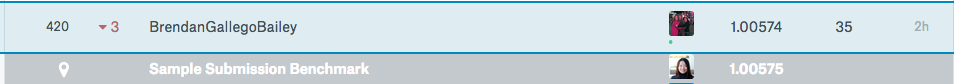

In [60]:
Image("Kaggle_Final_Score.png")